# **IMAGE DATA - ACQUISITION & DESIGN**

# 1. Installation & Packages Setup 
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [3]:
!apt-get install wget

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
wget is already the newest version (1.21.2-2ubuntu1).
0 upgraded, 0 newly installed, 0 to remove and 19 not upgraded.


In [4]:
import pandas as pd
import numpy as np
import gzip
import os
import requests
from urllib.parse import urljoin
import subprocess
from getpass import getpass
import json

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns  # for nicer plots
sns.set(style="darkgrid")  # default style

from copy import deepcopy
import re
import pprint
pd.options.display.max_columns = 999

from collections import Counter

# Set pandas to display the entire content of each column
pd.set_option('display.max_colwidth', None)

import shutil
from IPython.display import display, HTML
from sklearn.ensemble import IsolationForest
import cv2

# 2. Setup Constants & Functions
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [5]:
# Base URL and credentials
#base_url = 'https://physionet.org/content/mimic-cxr-jpg/2.0.0/files' # this is direct webpage address
base_url = 'https://physionet.org/files/mimic-cxr-jpg/2.0.0/files'  # this si for downloading files
username = 'asaleh'
password = getpass("Enter password for user 'asaleh': ")
local_base_dir = '/tf/mount/0 Berkeley/0 Spring 2024/w210 Capstone/Project/mimic_data'
main_json_dir = '/mimic_iv__multiclass_multioutput__json_files'
jpg_dir = '/mimic-cxr-jpg'

Enter password for user 'asaleh':  ········


In [6]:
# Input Json data files
train_inp_file   = local_base_dir + main_json_dir + '/' + 'train_set__chexpert.json'
val_inp_file     = local_base_dir + main_json_dir + '/' + 'validation_set__chexpert.json'
test_inp_file    = local_base_dir + main_json_dir + '/' + 'test_set__chexpert.json'
s_train_inp_file = local_base_dir + main_json_dir + '/' + 'sample__train_set__chexpert.json'
s_val_inp_file   = local_base_dir + main_json_dir + '/' + 'sample__validation_set__chexpert.json'
s_test_inp_file  = local_base_dir + main_json_dir + '/' + 'sample__test_set__chexpert.json'

In [7]:
# Input jpg image data files
jpg_dir  = '/downloaded_mimiciv_data/mimiciv_cxr_jpg/'
jpg_chexpert = local_base_dir + jpg_dir + 'mimic-cxr-2.0.0-chexpert.csv.gz'
jpg_metadata = local_base_dir + jpg_dir + 'mimic-cxr-2.0.0-metadata.csv.gz'
jpg_negbio   = local_base_dir + jpg_dir + 'mimic-cxr-2.0.0-negbio.csv.gz'
jpg_split    = local_base_dir + jpg_dir + 'mimic-cxr-2.0.0-split.csv.gz'

In [8]:
# Input cxr image data files
cxr_dir  = '/downloaded_mimiciv_data/mimiciv_cxr/'
cxr_record = local_base_dir + cxr_dir + 'cxr-record-list.csv.gz'
cxr_study = local_base_dir + cxr_dir + 'cxr-study-list.csv.gz'

In [9]:
def load_data(file_path, data_type):
    """
    Load data from a JSON file and add a column indicating the data type (train, validate, test).
    
    Parameters:
    - file_path: Path to the JSON file.
    - data_type: Type of data (train, validate, test).
    
    Returns:
    - DataFrame with loaded data and additional column for data type.
    """
    with open(file_path, 'r') as file:
        data = json.load(file)
    
    df = pd.DataFrame()
    df['patient_id'] = pd.Series(data['patient_id']).astype(float).astype("Int64")
    df['study_id'] = pd.Series(data['study_id']).astype(float).astype("Int64")
    df['atelectasis'] = pd.Series(data['atelectasis']).astype(float)
    df['cardiomegaly'] = pd.Series(data['cardiomegaly']).astype(float)
    df['edema'] = pd.Series(data['edema']).astype(float)
    df['lung_opacity'] = pd.Series(data['lung_opacity']).astype(float)
    df['pleural_effusion'] = pd.Series(data['pleural_effusion']).astype(float)
    df['pneumonia'] = pd.Series(data['pneumonia']).astype(float)
    df['data_type'] = data_type
    
    return df

# 3. Team Selected Input Data
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

## 3.1. Upload Data
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [10]:
# Load non-sample data
train_df = load_data(train_inp_file, 'train')
val_df = load_data(val_inp_file, 'validate')
test_df = load_data(test_inp_file, 'test')

# Load sample data
s_train_df = load_data(s_train_inp_file, 'train')
s_val_df = load_data(s_val_inp_file, 'validate')
s_test_df = load_data(s_test_inp_file, 'test')

In [11]:
# Mark all records in sample data as samples
sample_dfs = [s_train_df, s_val_df, s_test_df]
for df in sample_dfs:
    df['is_sample'] = True

# Combine non-sample and sample DataFrames
combined_df = pd.concat([train_df, val_df, test_df] + sample_dfs)

# Mark non-sampled records as not samples
combined_df['is_sample'] = combined_df['is_sample'].fillna(False)

# Remove duplicates, keeping the sampled version if it exists
combined_df = combined_df.drop_duplicates(subset=['patient_id', 'study_id', 'data_type'], keep='last').reset_index(drop=True)

In [12]:
# Display the combined DataFrame
print(combined_df.info())
combined_df

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16907 entries, 0 to 16906
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   patient_id        16907 non-null  Int64  
 1   study_id          16907 non-null  Int64  
 2   atelectasis       16907 non-null  float64
 3   cardiomegaly      16907 non-null  float64
 4   edema             16907 non-null  float64
 5   lung_opacity      16907 non-null  float64
 6   pleural_effusion  16907 non-null  float64
 7   pneumonia         16907 non-null  float64
 8   data_type         16907 non-null  object 
 9   is_sample         16907 non-null  bool   
dtypes: Int64(2), bool(1), float64(6), object(1)
memory usage: 1.2+ MB
None


,patient_id,study_id,atelectasis,cardiomegaly,edema,lung_opacity,pleural_effusion,pneumonia,data_type,is_sample
0,10000980,59988438,0.0,0.0,0.0,0.0,1.0,0.0,train,False
1,10001176,53186264,0.0,0.0,0.0,1.0,0.0,0.0,train,False
2,10001401,51065211,1.0,0.0,0.0,0.0,0.0,0.0,train,False
3,10002131,52823782,0.0,0.0,0.0,0.0,1.0,0.0,train,False
4,10003019,57194088,0.0,0.0,0.0,1.0,0.0,0.0,train,False
...,...,...,...,...,...,...,...,...,...,...
16902,19120479,59104642,0.0,0.0,0.0,0.0,0.0,0.0,test,True
16903,17397202,59601498,0.0,1.0,0.0,0.0,0.0,0.0,test,True
16904,13129811,51131723,0.0,0.0,0.0,0.0,0.0,0.0,test,True
16905,11908889,54264165,0.0,0.0,0.0,1.0,0.0,1.0,test,True


## 3.2. Examine Uploaded Data
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [13]:
# Examin uniqueness of patients
print("No. of unique patients: ",combined_df['patient_id'].nunique())

if combined_df['patient_id'].nunique() == combined_df.shape[0]:
    print("Datasets contain unique patients with no duplicates")
else: 
    print("Datasets contain recrods for patients with multi studies")

No. of unique patients:  16907
Datasets contain unique patients with no duplicates


In [14]:
# Double check number of records for each category

# Group by 'data_type' and 'is_sample' and count records in each group
category_counts = combined_df.groupby(['data_type', 'is_sample']).size().reset_index(name='count')

# Display the counts for each category
print(category_counts)

  data_type  is_sample  count
0      test      False   2535
1      test       True    282
2     train      False  10145
3     train       True   1127
4  validate      False   2536
5  validate       True    282


In [15]:
# Compute percentages of categories for entire data

# Group by 'data_type' and count records in each group
data_type_counts = combined_df.groupby('data_type').size().reset_index(name='total_count')

# Calculate the overall total
overall_total = data_type_counts['total_count'].sum()

# Calculate the percentage for each 'data_type'
data_type_counts['percentage'] = (data_type_counts['total_count'] / overall_total) * 100

# Display the total counts and percentages for each 'data_type'
print(data_type_counts)

  data_type  total_count  percentage
0      test         2817   16.661738
1     train        11272   66.670610
2  validate         2818   16.667652


In [16]:
# Compute percentages of categories for sampling data

# Filter the DataFrame to include only sample records
sample_df = combined_df[combined_df['is_sample']]

# Group by 'data_type' within the sample records and count records in each group
sample_counts = sample_df.groupby('data_type').size().reset_index(name='sample_count')

# Calculate the overall total of sample records
sample_total = sample_counts['sample_count'].sum()

# Calculate the percentage for each 'data_type' within samples
sample_counts['percentage'] = (sample_counts['sample_count'] / sample_total) * 100

# Display the total sample counts and percentages for each 'data_type'
print(sample_counts)

  data_type  sample_count  percentage
0      test           282   16.676523
1     train          1127   66.646954
2  validate           282   16.676523


## 3.3. Save Combined Data
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [ ]:
# Write combined_df to CSV
combined_df.to_csv('TeamSelectedData.csv', index=False)  # 'index=False' to avoid writing row indices

# 4. Team Input & Image Data Merger
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

## 4.1 Load Image Meta Data
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [17]:
# Load image related files
jpg_meta_df = pd.read_csv(jpg_metadata, compression ='gzip')

In [18]:
print(jpg_meta_df.info())
jpg_meta_df.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 377110 entries, 0 to 377109
Data columns (total 12 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   dicom_id                                    377110 non-null  object 
 1   subject_id                                  377110 non-null  int64  
 2   study_id                                    377110 non-null  int64  
 3   PerformedProcedureStepDescription           341598 non-null  object 
 4   ViewPosition                                361341 non-null  object 
 5   Rows                                        377110 non-null  int64  
 6   Columns                                     377110 non-null  int64  
 7   StudyDate                                   377110 non-null  int64  
 8   StudyTime                                   377110 non-null  float64
 9   ProcedureCodeSequence_CodeMeaning           377110 non-null  object 
 

,dicom_id,subject_id,study_id,PerformedProcedureStepDescription,ViewPosition,Rows,Columns,StudyDate,StudyTime,ProcedureCodeSequence_CodeMeaning,ViewCodeSequence_CodeMeaning,PatientOrientationCodeSequence_CodeMeaning
0,02aa804e-bde0afdd-112c0b34-7bc16630-4e384014,10000032,50414267,CHEST (PA AND LAT),PA,3056,2544,21800506,213014.531,CHEST (PA AND LAT),postero-anterior,Erect
1,174413ec-4ec4c1f7-34ea26b7-c5f994f8-79ef1962,10000032,50414267,CHEST (PA AND LAT),LATERAL,3056,2544,21800506,213014.531,CHEST (PA AND LAT),lateral,Erect


## 4.2 Merge Files
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [19]:
# Perform a merge operation
# 'left_on' specifies the key columns in the left DataFrame (combined_df)
# 'right_on' specifies the key columns in the right DataFrame (jpg_meta_df)
merged_df = pd.merge(combined_df, jpg_meta_df, how='left', left_on=['patient_id', 'study_id'], right_on=['subject_id', 'study_id'])
merged_df = merged_df.drop(columns=['subject_id'])

In [20]:
# Display the merged DataFrame
print("Unique patients: ",merged_df['patient_id'].nunique())
print(merged_df.info())
merged_df.head(2)

Unique patients:  16907
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33825 entries, 0 to 33824
Data columns (total 20 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   patient_id                                  33825 non-null  Int64  
 1   study_id                                    33825 non-null  Int64  
 2   atelectasis                                 33825 non-null  float64
 3   cardiomegaly                                33825 non-null  float64
 4   edema                                       33825 non-null  float64
 5   lung_opacity                                33825 non-null  float64
 6   pleural_effusion                            33825 non-null  float64
 7   pneumonia                                   33825 non-null  float64
 8   data_type                                   33825 non-null  object 
 9   is_sample                                   33825 non-null 

,patient_id,study_id,atelectasis,cardiomegaly,edema,lung_opacity,pleural_effusion,pneumonia,data_type,is_sample,dicom_id,PerformedProcedureStepDescription,ViewPosition,Rows,Columns,StudyDate,StudyTime,ProcedureCodeSequence_CodeMeaning,ViewCodeSequence_CodeMeaning,PatientOrientationCodeSequence_CodeMeaning
0,10000980,59988438,0.0,0.0,0.0,0.0,1.0,0.0,train,False,57a3c797-7272b246-fa226777-e4c7d84c-91ec2e96,CHEST (PA AND LAT),LATERAL,3056,2544,21880103,134324.015,CHEST (PA AND LAT),lateral,Erect
1,10000980,59988438,0.0,0.0,0.0,0.0,1.0,0.0,train,False,925b9496-a956d7b2-05185e52-bb33313b-c06ee522,CHEST (PA AND LAT),PA,3056,2544,21880103,134324.015,CHEST (PA AND LAT),postero-anterior,Erect


## 4.2b Save Merged File
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [ ]:
# Write merged_df to CSV
merged_df.to_csv('MergedImageMeta.csv', index=False)  # 'index=False' to avoid writing row indices

## 4.3 Examine Merged Data
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

Performed Procedure Description
-----------------------------------
No. of unique values:  8
PerformedProcedureStepDescription
CHEST (PA AND LAT)                    29586
CHEST (PORTABLE AP)                    3991
CHEST (SINGLE VIEW)                      48
Performed Desc                           47
CHEST (PA AND LAT) PORT                  12
TRAUMA #3 (PORT CHEST ONLY)               2
TRAUMA #2 (AP CXR AND PELVIS PORT)        1
CHEST (PRE-OP PA AND LAT)                 1
Name: count, dtype: int64

View Position
------------------------------
No. of unique values:  5
ViewPosition
LATERAL    14958
PA         10472
AP          8351
LL            38
PA LLD         1
Name: count, dtype: int64

Image size - Rows Summary:
------------------------------
count    33825.000000
mean      2938.592461
std        216.507174
min       1617.000000
25%       3050.000000
50%       3056.000000
75%       3056.000000
max       4280.000000
Name: Rows, dtype: float64

Image size - Columns Summary:
-------

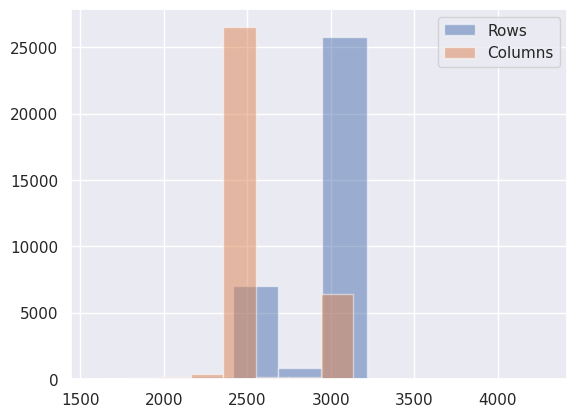


Procedure Code Sequence_Code Meaning
----------------------------------------
No. of unique values:  10
ProcedureCodeSequence_CodeMeaning
CHEST (PA AND LAT)                  29802
CHEST (PORTABLE AP)                  3913
lateral                                45
postero-anterior                       33
antero-posterior                       15
CHEST (SINGLE VIEW)                     8
DX CHEST WITH DECUB                     4
TRAUMA #3 (PORT CHEST ONLY)             2
CHEST PORT LINE/TUBE PLCT 1 EXAM        2
CHEST PRE-OP                            1
Name: count, dtype: int64

View Code Sequence_Code Meaning
----------------------------------------
No. of unique values:  5
ViewCodeSequence_CodeMeaning
lateral             14913
postero-anterior    10440
antero-posterior     8336
Erect                  92
left lateral           38
Name: count, dtype: int64

Patient Orientation Code Sequence_Code Meaning
--------------------------------------------------
No. of unique values:  2
Patient

In [22]:
# Check field characteristics
print("Performed Procedure Description\n" + "-"*35)
print("No. of unique values: ",merged_df['PerformedProcedureStepDescription'].nunique())
print(merged_df['PerformedProcedureStepDescription'].value_counts())

print("\nView Position\n" + "-"*30)
print("No. of unique values: ",merged_df['ViewPosition'].nunique())
print(merged_df['ViewPosition'].value_counts())

print("\nImage size - Rows Summary:\n" + "-"*30)
print(merged_df['Rows'].describe())
print("\nImage size - Columns Summary:\n" + "-"*30)
print(merged_df['Columns'].describe())

merged_df['Rows'].hist(alpha=0.5, label='Rows')
merged_df['Columns'].hist(alpha=0.5, label='Columns')
plt.legend()
plt.show()

print("\nProcedure Code Sequence_Code Meaning\n" + "-"*40)
print("No. of unique values: ",merged_df['ProcedureCodeSequence_CodeMeaning'].nunique())
print(merged_df['ProcedureCodeSequence_CodeMeaning'].value_counts())

print("\nView Code Sequence_Code Meaning\n" + "-"*40)
print("No. of unique values: ",merged_df['ViewCodeSequence_CodeMeaning'].nunique())
print(merged_df['ViewCodeSequence_CodeMeaning'].value_counts())

print("\nPatient Orientation Code Sequence_Code Meaning\n" + "-"*50)
print("No. of unique values: ",merged_df['PatientOrientationCodeSequence_CodeMeaning'].nunique())
print(merged_df['PatientOrientationCodeSequence_CodeMeaning'].value_counts())

## 4.4 Remove Images for Patients with >1 Image /Study
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [23]:
def process_images(group):
    """
    Processes a group of records for the same patient and study combination,
    applying a series of criteria to select the most relevant image based on
    view position, patient orientation, image orientation, image size, and other factors.
    
    Parameters:
    - group (DataFrame): Group of records for a unique patient-study combination.
    
    Returns:
    - DataFrame: The processed group with the selected record(s).
    """

    # Only proceed if there's more than one record for the combination
    if len(group) > 1:
        # Apply each criterion only if it helps reduce the number of records

        # Criterion 1: Non-lateral views are preferred
        if not group['ViewPosition'].isin(['LATERAL', 'LL', 'PA LLD']).all():
            filtered = group[~group['ViewPosition'].isin(['LATERAL', 'LL', 'PA LLD'])]
            if not filtered.empty:
                group = filtered

        # Criterion 2: Exclude 'Recumbent' orientation if there's a variation
        if 'Recumbent' in group['PatientOrientationCodeSequence_CodeMeaning'].values and group['PatientOrientationCodeSequence_CodeMeaning'].nunique() > 1:
            filtered = group[group['PatientOrientationCodeSequence_CodeMeaning'] != 'Recumbent']
            if not filtered.empty:
                group = filtered

        # Criterion 3: Prefer images with larger 'Rows' if orientations vary
        if group['Rows'].nunique() > 1 or group['Columns'].nunique() > 1:
            group = group.sort_values(by=['Rows', 'Columns'], ascending=False).drop_duplicates(['patient_id', 'study_id'], keep='first')

        # Criterion 4: Latest 'StudyTime' if times vary
        if group['StudyTime'].nunique() > 1:
            group = group.sort_values(by='StudyTime', ascending=False).head(1)

        # Additional handling for remaining images per study
        if len(group) > 1:
            # Criterion 1: Prefer non-lateral views if there's a variation
            if not group['ViewPosition'].isin(['LATERAL', 'LL', 'PA LLD']).all():
                non_lateral_views = group[~group['ViewPosition'].isin(['LATERAL', 'LL', 'PA LLD'])]
                if not non_lateral_views.empty:
                    group = non_lateral_views
        
            # Criterion 2: Remove record with NaN in 'PatientOrientationCodeSequence_CodeMeaning' if that's the only difference
            if len(group) > 1 and group['PatientOrientationCodeSequence_CodeMeaning'].isna().any():
                non_nan_orientation = group.dropna(subset=['PatientOrientationCodeSequence_CodeMeaning'])
                if not non_nan_orientation.empty:
                    group = non_nan_orientation
        
            # Criterion 3: Remove record with lower 'Columns' if that's the only difference
            if len(group) > 1:
                group = group.sort_values(by='Columns', ascending=False).drop_duplicates(['patient_id', 'study_id'], keep='first')
        
            # Additional criterion for 'antero-posterior' view
            if len(group) > 1:
                ap_views = group[group['ViewCodeSequence_CodeMeaning'] == 'antero-posterior']
                if not ap_views.empty:
                    group = ap_views
                # No random selection; remaining records are left for further assessment

    return group

# Apply the function to each patient-study group and concatenate the results
processed_images_df = pd.concat([process_images(group) for _, group in merged_df.groupby(['patient_id', 'study_id'])]).reset_index(drop=True)

In [24]:
# Display the shape and unique patient count of the processed DataFrame
print("Processed DataFrame shape:", processed_images_df.shape)
print("Unique patient-study combinations in processed_images_df:", processed_images_df.groupby(['patient_id', 'study_id']).ngroups)

Processed DataFrame shape: (16907, 20)
Unique patient-study combinations in processed_images_df: 16907


In [25]:
# Group by 'patient_id' and 'study_id' and filter groups with more than one record
multi_image_studies_final = processed_images_df.groupby(['patient_id', 'study_id']).filter(lambda x: len(x) > 1)

In [26]:
# Display the records with more than one image per study after processing
print("No. of patients with more than 1 image/study still: ",multi_image_studies_final['patient_id'].count())
multi_image_studies_final

No. of patients with more than 1 image/study still:  0


,patient_id,study_id,atelectasis,cardiomegaly,edema,lung_opacity,pleural_effusion,pneumonia,data_type,is_sample,dicom_id,PerformedProcedureStepDescription,ViewPosition,Rows,Columns,StudyDate,StudyTime,ProcedureCodeSequence_CodeMeaning,ViewCodeSequence_CodeMeaning,PatientOrientationCodeSequence_CodeMeaning


## 4.5 Examine Processed Data
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

Performed Procedure Description
-----------------------------------
No. of unique values:  8
PerformedProcedureStepDescription
CHEST (PA AND LAT)                    13193
CHEST (PORTABLE AP)                    3597
NaN                                      68
CHEST (SINGLE VIEW)                      24
Performed Desc                           16
CHEST (PA AND LAT) PORT                   6
TRAUMA #3 (PORT CHEST ONLY)               1
TRAUMA #2 (AP CXR AND PELVIS PORT)        1
CHEST (PRE-OP PA AND LAT)                 1
Name: count, dtype: int64

View Position
------------------------------
No. of unique values:  3
ViewPosition
PA         9141
AP         7722
LATERAL      39
NaN           5
Name: count, dtype: int64

Image size - Rows Summary:
------------------------------
count    16907.000000
mean      2865.607441
std        249.048730
min       1760.000000
25%       2544.000000
50%       3056.000000
75%       3056.000000
max       4280.000000
Name: Rows, dtype: float64

Image size - C

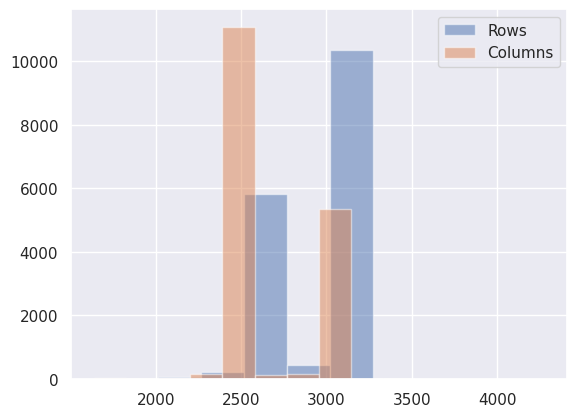


Procedure Code Sequence_Code Meaning
----------------------------------------
No. of unique values:  9
ProcedureCodeSequence_CodeMeaning
CHEST (PA AND LAT)                  13249
CHEST (PORTABLE AP)                  3607
postero-anterior                       27
antero-posterior                       14
CHEST (SINGLE VIEW)                     6
TRAUMA #3 (PORT CHEST ONLY)             1
CHEST PORT LINE/TUBE PLCT 1 EXAM        1
DX CHEST WITH DECUB                     1
CHEST PRE-OP                            1
Name: count, dtype: int64

View Code Sequence_Code Meaning
----------------------------------------
No. of unique values:  4
ViewCodeSequence_CodeMeaning
postero-anterior    9114
antero-posterior    7708
Erect                 41
lateral               39
NaN                    5
Name: count, dtype: int64

Patient Orientation Code Sequence_Code Meaning
--------------------------------------------------
No. of unique values:  2
PatientOrientationCodeSequence_CodeMeaning
Erect       

In [27]:
# Check processed characteristics
print("Performed Procedure Description\n" + "-"*35)
print("No. of unique values: ",processed_images_df['PerformedProcedureStepDescription'].nunique())
print(processed_images_df['PerformedProcedureStepDescription'].value_counts(dropna=False))

print("\nView Position\n" + "-"*30)
print("No. of unique values: ",processed_images_df['ViewPosition'].nunique())
print(processed_images_df['ViewPosition'].value_counts(dropna=False))

print("\nImage size - Rows Summary:\n" + "-"*30)
print(processed_images_df['Rows'].describe())
print("\nImage size - Columns Summary:\n" + "-"*30)
print(processed_images_df['Columns'].describe())

processed_images_df['Rows'].hist(alpha=0.5, label='Rows')
processed_images_df['Columns'].hist(alpha=0.5, label='Columns')
plt.legend()
plt.show()

print("\nProcedure Code Sequence_Code Meaning\n" + "-"*40)
print("No. of unique values: ",processed_images_df['ProcedureCodeSequence_CodeMeaning'].nunique())
print(processed_images_df['ProcedureCodeSequence_CodeMeaning'].value_counts(dropna=False))

print("\nView Code Sequence_Code Meaning\n" + "-"*40)
print("No. of unique values: ",processed_images_df['ViewCodeSequence_CodeMeaning'].nunique())
print(processed_images_df['ViewCodeSequence_CodeMeaning'].value_counts(dropna=False))

print("\nPatient Orientation Code Sequence_Code Meaning\n" + "-"*50)
print("No. of unique values: ",processed_images_df['PatientOrientationCodeSequence_CodeMeaning'].nunique())
print(processed_images_df['PatientOrientationCodeSequence_CodeMeaning'].value_counts(dropna=False))

In [28]:
# Check accuracy of results above
# 1. Check if ViewPosition=LATERAL images are the only images for the patient
processed_images_df[processed_images_df['ViewPosition']=='LATERAL'][:40]

,patient_id,study_id,atelectasis,cardiomegaly,edema,lung_opacity,pleural_effusion,pneumonia,data_type,is_sample,dicom_id,PerformedProcedureStepDescription,ViewPosition,Rows,Columns,StudyDate,StudyTime,ProcedureCodeSequence_CodeMeaning,ViewCodeSequence_CodeMeaning,PatientOrientationCodeSequence_CodeMeaning
236,10143019,52412336,0.0,0.0,0.0,0.0,0.0,0.0,test,False,90eec70f-fcfb8c87-e85ec4c6-c91314b1-05703abf,CHEST (PA AND LAT),LATERAL,3056,2544,21220802,175404.343,CHEST (PA AND LAT),lateral,Erect
362,10228186,57118202,0.0,0.0,0.0,0.0,1.0,0.0,validate,False,19628fb4-9f374e7f-a955c2dd-7574a97b-dc87532f,CHEST (PA AND LAT),LATERAL,3056,2544,21590131,194958.703,CHEST (PA AND LAT),lateral,Erect
599,10355641,56922713,0.0,0.0,0.0,0.0,0.0,0.0,train,False,d61150aa-24c10a32-f8546ac9-dc2ae155-e20d9d5c,CHEST (PA AND LAT),LATERAL,3056,2544,21320306,152027.437,CHEST (PA AND LAT),lateral,Erect
622,10371464,50690428,0.0,0.0,0.0,0.0,0.0,0.0,validate,False,ec2d797a-3b7de1bf-cb04f82b-ea086f7e-af576d6d,CHEST (PA AND LAT),LATERAL,3056,2544,21500507,144316.421,CHEST (PA AND LAT),lateral,Erect
766,10454129,50455850,1.0,0.0,0.0,0.0,1.0,0.0,train,False,196b7b05-aeb22a69-405cb909-9c4a4898-92903e63,CHEST (PA AND LAT),LATERAL,3056,2544,21940510,170251.921,CHEST (PA AND LAT),lateral,Erect
895,10539412,58775792,0.0,0.0,0.0,0.0,0.0,0.0,train,False,02bec884-cf70d931-31dc6018-e0f4d563-90bbed0e,CHEST (PA AND LAT),LATERAL,3056,2544,21500617,143710.390,CHEST (PA AND LAT),lateral,Erect
1191,10710233,58399729,1.0,0.0,0.0,0.0,0.0,0.0,train,True,416ea9dc-066cbd69-66b3cbf9-9df1ed35-232cf6f7,CHEST (PA AND LAT),LATERAL,3056,2544,21380213,214009.734,CHEST (PA AND LAT),lateral,Erect
1277,10765488,50989330,0.0,0.0,0.0,0.0,0.0,0.0,test,False,5f513abc-d59243c8-2f97e377-8fb94077-8fa52e6b,CHEST (PA AND LAT),LATERAL,3056,2544,21971231,164500.312,CHEST (PA AND LAT),lateral,Erect
1452,10870690,59643872,0.0,0.0,0.0,0.0,0.0,0.0,test,False,3276bebc-3c3d7e7e-6bd6ca16-a6dafa3c-5ea387a0,CHEST (PA AND LAT),LATERAL,3056,2544,21331125,175628.937,CHEST (PA AND LAT),lateral,Erect
1698,11012124,57234352,1.0,0.0,0.0,0.0,0.0,0.0,test,False,ec186481-8087d009-be44e442-ddaadd75-2d6786f4,CHEST (PA AND LAT),LATERAL,3056,2544,21310210,233152.140,CHEST (PA AND LAT),lateral,Erect


In [ ]:
merged_df[merged_df['patient_id']==10228186]

In [ ]:
merged_df[merged_df['patient_id']==10355641]

## 4.6 Save Processed Data
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [ ]:
# Save processed_df to CSV
processed_df.to_csv('ProcessedImage_Data.csv', index=False)  # 'index=False' to avoid writing row indices

# 5. Images Acquisition
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

## 5.1 Establish File Directory Paths
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [29]:
# Define base directory where images will be stored
images_local_base_dir = os.path.join(local_base_dir, 'mimic_images')

# Directory names for training, validation, testing sets and their sample counterparts
train_dir = 'train_images'
validate_dir = 'validate_images'
test_dir = 'test_images'
s_train_dir = 'sample_train_images'
s_validate_dir = 'sample_validate_images'
s_test_dir = 'sample_test_images'

# Ensure that the directories exist
for dir_name in [train_dir, validate_dir, test_dir, s_train_dir, s_validate_dir, s_test_dir]:
    dir_path = os.path.join(images_local_base_dir, dir_name)
    if not os.path.exists(dir_path):
        os.makedirs(dir_path)

## 5.2 Add Image File Name to Main Input Dataframe
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [30]:
# Add a column in processed_df for the jpg filename
# Ensure 'patient_id' is of string type before constructing 'jpg_filename'
processed_images_df['jpg_filename'] = base_url + '/p' + processed_images_df['patient_id'].astype(str).str[:2] + '/p' + processed_images_df['patient_id'].astype(str) + '/s' + processed_images_df['study_id'].astype(str) + '/' + processed_images_df['dicom_id'].astype(str) + ".jpg"

# Sort processed_df on data_type for later storage efficiency
processed_df = processed_images_df.sort_values(by='data_type')

## 5.3 Download and Store Images
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [33]:
# Loop through each record in processed_df to download and store images
''' This was completed! DO NOT RUN AGAIN as it takes a long time!!
for idx, row in processed_df.iterrows():
    # Determine the target directories
    target_dirs = []
    if row['data_type'] == 'train':
        target_dirs.append(os.path.join(local_base_dir, train_dir))
        if row['is_sample']:
            target_dirs.append(os.path.join(local_base_dir, s_train_dir))
    elif row['data_type'] == 'validate':
        target_dirs.append(os.path.join(local_base_dir, validate_dir))
        if row['is_sample']:
            target_dirs.append(os.path.join(local_base_dir, s_validate_dir))
    else:  # 'test'
        target_dirs.append(os.path.join(local_base_dir, test_dir))
        if row['is_sample']:
            target_dirs.append(os.path.join(local_base_dir, s_test_dir))

    # Construct wget command
    wget_command = [
        'wget', '-r', '-N', '-c', '-np',
        '--user', username, '--password', password,
        row['jpg_filename']
    ]
    
    # Execute the wget command for each target directory
    for target_dir in target_dirs:
        subprocess.run(wget_command + ['-P', target_dir])

print(f'Downloaded all files to {local_base_dir}')
'''
None

In [34]:
processed_df.head()

,patient_id,study_id,atelectasis,cardiomegaly,edema,lung_opacity,pleural_effusion,pneumonia,data_type,is_sample,dicom_id,PerformedProcedureStepDescription,ViewPosition,Rows,Columns,StudyDate,StudyTime,ProcedureCodeSequence_CodeMeaning,ViewCodeSequence_CodeMeaning,PatientOrientationCodeSequence_CodeMeaning,jpg_filename
16906,19998562,52252154,0.0,0.0,0.0,0.0,1.0,0.0,test,False,e3e5f8c3-14429887-b1181522-445ec3a8-110663c3,CHEST (PA AND LAT),PA,3056,2544,21660321,224219.015,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19998562/s52252154/e3e5f8c3-14429887-b1181522-445ec3a8-110663c3.jpg
6427,13831580,55371824,0.0,0.0,0.0,0.0,0.0,0.0,test,False,f34f44ce-0feade9a-8a71da5b-6e080e42-643cb41d,CHEST (PA AND LAT),PA,3056,2544,22031114,210815.687,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13831580/s55371824/f34f44ce-0feade9a-8a71da5b-6e080e42-643cb41d.jpg
6417,13821690,51731689,0.0,0.0,0.0,0.0,0.0,1.0,test,False,530558f0-36c6d0bb-981611dd-0307beb9-72fb7a9c,CHEST (PA AND LAT),PA,3056,2504,21671209,140820.625,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13821690/s51731689/530558f0-36c6d0bb-981611dd-0307beb9-72fb7a9c.jpg
15812,19345192,58352993,0.0,0.0,1.0,0.0,1.0,0.0,test,False,9e76d118-5c714b25-d3215932-201cf84d-27a83d7d,CHEST (PA AND LAT),AP,3056,2544,21780123,194521.093,CHEST (PA AND LAT),antero-posterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19345192/s58352993/9e76d118-5c714b25-d3215932-201cf84d-27a83d7d.jpg
6408,13815588,59633666,0.0,0.0,0.0,0.0,1.0,0.0,test,False,98760876-86d729a0-baa9c788-51be88c9-eab223ed,CHEST (PA AND LAT),PA,3056,2544,21290122,142622.000,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13815588/s59633666/98760876-86d729a0-baa9c788-51be88c9-eab223ed.jpg


# 6. Image Storage Consolidation
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [35]:
# Directories for source and target files
''' This is done
source_dirs = {
    'train': local_base_dir + '/train_images/physionet.org/files/mimic-cxr-jpg/2.0.0/files/',
    'validate': local_base_dir + '/validate_images/physionet.org/files/mimic-cxr-jpg/2.0.0/files/',
    'test': local_base_dir + '/test_images/physionet.org/files/mimic-cxr-jpg/2.0.0/files/',
    'sample_train': local_base_dir + '/sample_train_images/physionet.org/files/mimic-cxr-jpg/2.0.0/files/',
    'sample_validate': local_base_dir + '/sample_validate_images/physionet.org/files/mimic-cxr-jpg/2.0.0/files/',
    'sample_test': local_base_dir + '/sample_test_images/physionet.org/files/mimic-cxr-jpg/2.0.0/files/',
}
target_dirs = {
    'train': local_base_dir + '/train_images/',
    'validate': local_base_dir + '/validate_images/',
    'test': local_base_dir + '/test_images/',
    'sample_train': local_base_dir + '/sample_train_images/',
    'sample_validate': local_base_dir + '/sample_validate_images/',
    'sample_test': local_base_dir + '/sample_test_images/',
}

# Create target directories if they don't exist
for dir_path in target_dirs.values():
    if not os.path.exists(dir_path):
        os.makedirs(dir_path)

# Function to move images
def move_image(row):
    # Determine the source and target directories
    if row['is_sample']:
        source_dir = source_dirs[f'sample_{row["data_type"]}']
        target_dir = target_dirs[f'sample_{row["data_type"]}']
    else:
        source_dir = source_dirs[row["data_type"]]
        target_dir = target_dirs[row["data_type"]]

    # Determine the source file path
    patient_group = f'p{str(row["patient_id"])[:2]}'
    patient_dir = f'p{row["patient_id"]}'
    study_dir = f's{row["study_id"]}'
    source_path = os.path.join(source_dir, patient_group, patient_dir, study_dir)
    #print(source_path)

    # Move all files from source to target directory
    for filename in os.listdir(source_path):
        file_path = os.path.join(source_path, filename)
        #print(file_path)
        shutil.move(file_path, target_dir)

# Iterate over the dataframe and move each image
processed_df.apply(move_image, axis=1)
'''
None

# 7. Image Quality Assessment
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

## 7.1 Examination Using Tables
Start with tabular examination of data by ranking values from largest to smallest or vice versa
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [36]:
# Show min & max sizes
top_5_rows = processed_df.nlargest(10, 'Rows')[['patient_id', 'Rows']]
top_5_cols = processed_df.nlargest(10, 'Columns')[['patient_id', 'Columns']]
bot_5_rows = processed_df.nsmallest(10, 'Rows')[['patient_id', 'Rows']]
bot_5_cols = processed_df.nsmallest(10, 'Columns')[['patient_id', 'Columns']]

# Convert DataFrames to HTML
top_rows_html = top_5_rows.to_html()
top_cols_html = top_5_cols.to_html()
bot_rows_html = bot_5_rows.to_html()
bot_cols_html = bot_5_cols.to_html()

# Use HTML to structure the tables side by side using <table> tags within a <div>
html = f"""
<div style="display: flex;">
    <div style="padding: 10px;">{top_rows_html}</div>
    <div style="padding: 10px;">{top_cols_html}</div>
    <div style="padding: 10px;">{bot_rows_html}</div>
    <div style="padding: 10px;">{bot_cols_html}</div>
</div>
"""

# Display the HTML content
display(HTML(html))

,patient_id,Rows
1901,11134683,4280
16906,19998562,3056
6427,13831580,3056
6417,13821690,3056
15812,19345192,3056
6408,13815588,3056
6396,13806958,3056
6378,13797527,3056
6358,13783064,3056
6356,13780888,3056


**Conclusion:**
* Remove patient 11134683. Image size is drasticaly above everything else. It is higher resolution but using it might give it unfair preference given that all other images are of much lower resolution.

Next: use common methods to detect anomolies

**Interquartile Range (IQR) method**

In [37]:
# Interquartile Range (IQR) method for statistical outlier detection,
Q1 = processed_df[['Rows', 'Columns']].quantile(0.25)
Q3 = processed_df[['Rows', 'Columns']].quantile(0.75)
IQR = Q3 - Q1

# Define bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Detect outliers
outliers_1 = processed_df[((processed_df[['Rows', 'Columns']] < lower_bound) | (processed_df[['Rows', 'Columns']] > upper_bound)).any(axis=1)]
print("No. of Outliers: ",len(outliers_1))
print("List of patients with 'Outliers' size: \n",outliers_1['patient_id'])

No. of Outliers:  11
List of patients with 'Outliers' size: 
 8579     15118488
1123     10673550
13498    18026405
4393     12604446
1901     11134683
2389     11432850
2161     11289183
15804    19339564
15724    19290484
11684    16980011
7945     14741847
Name: patient_id, dtype: Int64


**Isolation Forest Method**

In [38]:
# Isolation Forest, a machine learning algorithm designed for anomaly detection
X = processed_df[['Rows', 'Columns']]

# Initialize Isolation Forest
# contamination is an estimate of the proportion of outliers in the data set
# I estimated it based on visual inspection: 
visual_num = len(processed_df[processed_df['Rows']<2050]) + len(processed_df[processed_df['Columns']>3100])
contamination_ratio = visual_num / len(processed_df)
                                       
iso_forest = IsolationForest(contamination=contamination_ratio)  

# Fit the model and predict anomalies
iso_forest.fit(X)
anomalies = iso_forest.predict(X)  # -1 indicates outliers

# Add a column to the DataFrame to indicate anomalies
processed_df['anomaly'] = anomalies
outliers_2 = processed_df[processed_df['anomaly'] == -1]
print("Number of visually observed outliers: ",visual_num)
print("Computed contamination ratio: ",contamination_ratio)
print("No. of Outliers: ",len(outliers_2))
print("List of patients with 'Outliers' size: \n",outliers_2['patient_id'])

Number of visually observed outliers:  27
Computed contamination ratio:  0.001596971668539658
No. of Outliers:  25
List of patients with 'Outliers' size: 
 16246    19607507
3815     12268505
12541    17463311
10497    16235760
9124     15429143
8579     15118488
8502     15066909
8806     15247811
14111    18378327
16854    19961925
12209    17285008
12307    17342737
4432     12625430
4393     12604446
2389     11432850
2161     11289183
1392     10840747
1229     10740052
7760     14635690
1506     10905663
1584     10952022
15804    19339564
15724    19290484
12228    17292590
7945     14741847
Name: patient_id, dtype: Int64


The coincidence in the numbers observed between visual estimate and computed can be partly attributed to how the contamination ratio and the Isolation Forest algorithm work, but it's not a guarantee that this alignment will always occur. The match between the estimated number of outliers and the Isolation Forest's output in this case can be seen as a successful alignment of my contamination estimate with the actual data distribution. However, this exact alignment might not always occur, and adjustments to the contamination rate might be necessary to optimize the performance of the Isolation Forest algorithm for different datasets or outlier distributions.

**Common Outliers Between Two Methods**

In [39]:
Common_outliers = pd.merge(outliers_1, outliers_2, how='inner', on=['patient_id', 'study_id'])
print("No. of Common Outliers: ",len(Common_outliers))
Common_outliers

No. of Common Outliers:  7


,patient_id,study_id,atelectasis_x,cardiomegaly_x,edema_x,lung_opacity_x,pleural_effusion_x,pneumonia_x,data_type_x,is_sample_x,dicom_id_x,PerformedProcedureStepDescription_x,ViewPosition_x,Rows_x,Columns_x,StudyDate_x,StudyTime_x,ProcedureCodeSequence_CodeMeaning_x,ViewCodeSequence_CodeMeaning_x,PatientOrientationCodeSequence_CodeMeaning_x,jpg_filename_x,atelectasis_y,cardiomegaly_y,edema_y,lung_opacity_y,pleural_effusion_y,pneumonia_y,data_type_y,is_sample_y,dicom_id_y,PerformedProcedureStepDescription_y,ViewPosition_y,Rows_y,Columns_y,StudyDate_y,StudyTime_y,ProcedureCodeSequence_CodeMeaning_y,ViewCodeSequence_CodeMeaning_y,PatientOrientationCodeSequence_CodeMeaning_y,jpg_filename_y,anomaly
0,15118488,50697004,0.0,0.0,0.0,0.0,0.0,0.0,train,False,8e777ead-fe16bc50-fa771ee4-240707e6-600dd1c8,NaN,PA,1926,1636,21520921,161915.0,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p15/p15118488/s50697004/8e777ead-fe16bc50-fa771ee4-240707e6-600dd1c8.jpg,0.0,0.0,0.0,0.0,0.0,0.0,train,False,8e777ead-fe16bc50-fa771ee4-240707e6-600dd1c8,NaN,PA,1926,1636,21520921,161915.0,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p15/p15118488/s50697004/8e777ead-fe16bc50-fa771ee4-240707e6-600dd1c8.jpg,-1
1,12604446,59685494,0.0,0.0,0.0,0.0,0.0,0.0,train,False,dd3a8464-cdd97dd6-64ff83d2-95e0b464-cd22de3e,Performed Desc,PA,2021,1767,21810412,155653.0,CHEST (PA AND LAT),postero-anterior,Recumbent,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p12/p12604446/s59685494/dd3a8464-cdd97dd6-64ff83d2-95e0b464-cd22de3e.jpg,0.0,0.0,0.0,0.0,0.0,0.0,train,False,dd3a8464-cdd97dd6-64ff83d2-95e0b464-cd22de3e,Performed Desc,PA,2021,1767,21810412,155653.0,CHEST (PA AND LAT),postero-anterior,Recumbent,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p12/p12604446/s59685494/dd3a8464-cdd97dd6-64ff83d2-95e0b464-cd22de3e.jpg,-1
2,11432850,52121065,0.0,0.0,0.0,0.0,0.0,0.0,train,False,2c295e81-f7397ad0-f606ead9-52dfc5ed-4d9e0b74,NaN,PA,2022,1736,22020531,160833.0,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p11/p11432850/s52121065/2c295e81-f7397ad0-f606ead9-52dfc5ed-4d9e0b74.jpg,0.0,0.0,0.0,0.0,0.0,0.0,train,False,2c295e81-f7397ad0-f606ead9-52dfc5ed-4d9e0b74,NaN,PA,2022,1736,22020531,160833.0,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p11/p11432850/s52121065/2c295e81-f7397ad0-f606ead9-52dfc5ed-4d9e0b74.jpg,-1
3,11289183,56334635,0.0,0.0,0.0,0.0,0.0,0.0,train,False,882ffc38-45a68bac-021bde16-5d39de36-37d3d70f,NaN,PA,2022,1736,21550524,165808.0,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p11/p11289183/s56334635/882ffc38-45a68bac-021bde16-5d39de36-37d3d70f.jpg,0.0,0.0,0.0,0.0,0.0,0.0,train,False,882ffc38-45a68bac-021bde16-5d39de36-37d3d70f,NaN,PA,2022,1736,21550524,165808.0,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p11/p11289183/s56334635/882ffc38-45a68bac-021bde16-5d39de36-37d3d70f.jpg,-1
4,19339564,51285281,0.0,0.0,0.0,0.0,0.0,0.0,train,False,fead856e-03ef6f28-f7612a6a-6656fbb8-63702cba,CHEST (PA AND LAT),NaN,1760,2140,21560502,184616.0,CHEST (PA AND LAT),NaN,NaN,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19339564/s51285281/fead856e-03ef6f28-f7612a6a-6656fbb8-63702cba.jpg,0.0,0.0,0.0,0.0,0.0,0.0,train,False,fead856e-03ef6f28-f7612a6a-6656fbb8-63702cba,CHEST (PA AND LAT),NaN,1760,2140,21560502,184616.0,CHEST (PA AND LAT),NaN,NaN,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19339564/s51285281/fead856e-03ef6f28-f7612a6a-6656fbb8-63702cba.jpg,-1
5,19290484,57509657,0.0,1.0,0.0,0.0,0.0,0.0,validate,False,27d249a9-5914069f-b812e92f-3a48e48a-d8bad8a5,Performed Desc,PA,2021,1761,21920529,135905.0,CHEST (PA AND LAT),postero-anterior,Recumbent,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19290484/s57509657/27d249a9-5914069f-b812e92f

## 7.2 Examination Using Plots
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

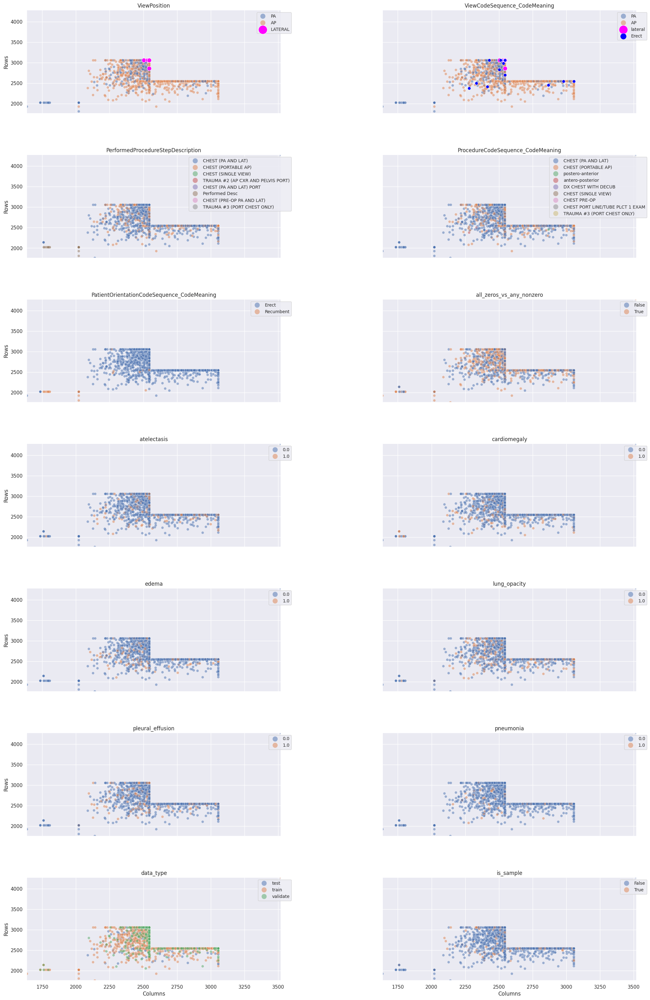

In [40]:
# Setting the figure size and layout
min_row = processed_df['Rows'].min()
max_row = processed_df['Rows'].max()
min_col = processed_df['Columns'].min()
max_col = processed_df['Columns'].max()

# Setting the figure size and layout
fig, axs = plt.subplots(7, 2, figsize=(25, 40), sharex=True, sharey=True)

# Adjusting the layout
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# List of scenarios
scenarios = [
    'ViewPosition', 'ViewCodeSequence_CodeMeaning', 'PerformedProcedureStepDescription', 
    'ProcedureCodeSequence_CodeMeaning', 'PatientOrientationCodeSequence_CodeMeaning',  'all_zeros_vs_any_nonzero',
    'atelectasis','cardiomegaly', 'edema', 'lung_opacity', 'pleural_effusion', 'pneumonia', 'data_type', 'is_sample',
]

# Function to plot each scenario
def plot_scenario(ax, scenario, data):
    if scenario == 'all_zeros_vs_any_nonzero':
        data['all_zeros'] = (data[['atelectasis', 'cardiomegaly', 'edema', 'lung_opacity', 'pleural_effusion', 'pneumonia']] == 0).all(axis=1)
        sns.scatterplot(ax=ax, data=data, x='Columns', y='Rows', hue='all_zeros', alpha=0.5)
    elif scenario == 'ViewPosition':
        # Plotting other groups
        sns.scatterplot(ax=ax, data=data[data['ViewPosition'] != 'LATERAL'], x='Columns', y='Rows', hue='ViewPosition', alpha=0.5)
        # Plotting LATERAL group with distinct styling
        sns.scatterplot(ax=ax, data=data[data['ViewPosition'] == 'LATERAL'], x='Columns', y='Rows', color='magenta', s=100, label='LATERAL', alpha=1)
    elif scenario == 'ViewCodeSequence_CodeMeaning':
        # Plotting other groups
        sns.scatterplot(ax=ax, data=data[data['ViewCodeSequence_CodeMeaning'] != 'lateral'], x='Columns', y='Rows', hue='ViewPosition', alpha=0.5)
        # Plotting lateral & Erect groups with distinct styling
        sns.scatterplot(ax=ax, data=data[data['ViewCodeSequence_CodeMeaning'] == 'lateral'], x='Columns', y='Rows', color='magenta', s=100, label='lateral', alpha=1)
        sns.scatterplot(ax=ax, data=data[data['ViewCodeSequence_CodeMeaning'] == 'Erect'], x='Columns', y='Rows', color='blue', s=50, label='Erect', alpha=1)
    else:
        sns.scatterplot(ax=ax, data=data, x='Columns', y='Rows', hue=scenario, alpha=0.5)

# Plotting each scenario
for i, scenario in enumerate(scenarios):
    plot_scenario(axs[i//2, i%2], scenario, processed_df)
    axs[i//2, i%2].set_title(scenario)
    axs[i//2, i%2].legend(loc='best', fontsize='small', markerscale=2, bbox_to_anchor=(1.05, 1))

plt.xlim([min_col, max_col])  # Set consistent x-axis range
plt.ylim([min_row, max_row])  # Set consistent y-axis range
plt.show()

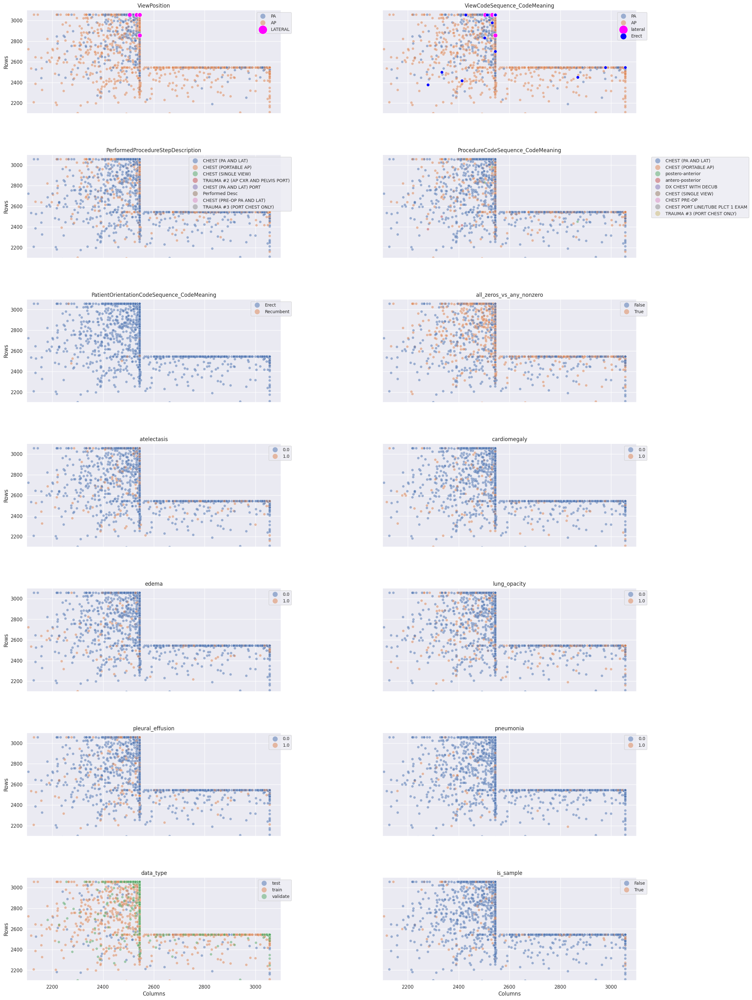

In [41]:
# Redo plots with truncated data
# Setting the figure size and layout
min_row = 2100
max_row = 3100
min_col = 2100
max_col = 3100

# Setting the figure size and layout
fig, axs = plt.subplots(7, 2, figsize=(25, 40), sharex=True, sharey=True)

# Adjusting the layout
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# List of scenarios
scenarios = [
    'ViewPosition', 'ViewCodeSequence_CodeMeaning', 'PerformedProcedureStepDescription', 
    'ProcedureCodeSequence_CodeMeaning', 'PatientOrientationCodeSequence_CodeMeaning',  'all_zeros_vs_any_nonzero',
    'atelectasis','cardiomegaly', 'edema', 'lung_opacity', 'pleural_effusion', 'pneumonia', 'data_type', 'is_sample',
]

# Function to plot each scenario
def plot_scenario(ax, scenario, data):
    if scenario == 'all_zeros_vs_any_nonzero':
        data['all_zeros'] = (data[['atelectasis', 'cardiomegaly', 'edema', 'lung_opacity', 'pleural_effusion', 'pneumonia']] == 0).all(axis=1)
        sns.scatterplot(ax=ax, data=data, x='Columns', y='Rows', hue='all_zeros', alpha=0.5)
    elif scenario == 'ViewPosition':
        # Plotting other groups
        sns.scatterplot(ax=ax, data=data[data['ViewPosition'] != 'LATERAL'], x='Columns', y='Rows', hue='ViewPosition', alpha=0.5)
        # Plotting LATERAL group with distinct styling
        sns.scatterplot(ax=ax, data=data[data['ViewPosition'] == 'LATERAL'], x='Columns', y='Rows', color='magenta', s=100, label='LATERAL', alpha=1)
    elif scenario == 'ViewCodeSequence_CodeMeaning':
        # Plotting other groups
        sns.scatterplot(ax=ax, data=data[data['ViewCodeSequence_CodeMeaning'] != 'lateral'], x='Columns', y='Rows', hue='ViewPosition', alpha=0.5)
        # Plotting lateral & Erect groups with distinct styling
        sns.scatterplot(ax=ax, data=data[data['ViewCodeSequence_CodeMeaning'] == 'lateral'], x='Columns', y='Rows', color='magenta', s=100, label='lateral', alpha=1)
        sns.scatterplot(ax=ax, data=data[data['ViewCodeSequence_CodeMeaning'] == 'Erect'], x='Columns', y='Rows', color='blue', s=50, label='Erect', alpha=1)
    else:
        sns.scatterplot(ax=ax, data=data, x='Columns', y='Rows', hue=scenario, alpha=0.5)

# Plotting each scenario
for i, scenario in enumerate(scenarios):
    plot_scenario(axs[i//2, i%2], scenario, processed_df)
    axs[i//2, i%2].set_title(scenario)
    axs[i//2, i%2].legend(loc='best', fontsize='small', markerscale=2, bbox_to_anchor=(1.05, 1))

plt.xlim([min_col, max_col])  # Set consistent x-axis range
plt.ylim([min_row, max_row])  # Set consistent y-axis range
plt.show()

## 7.3 Image Size Comparisons & Effects 
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

### 7.3.1 Image Size Comparisons Using Default Matplotlib Settings 
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

/tf/mount/0 Berkeley/0 Spring 2024/w210 Capstone/Project/mimic_data/mimic_images


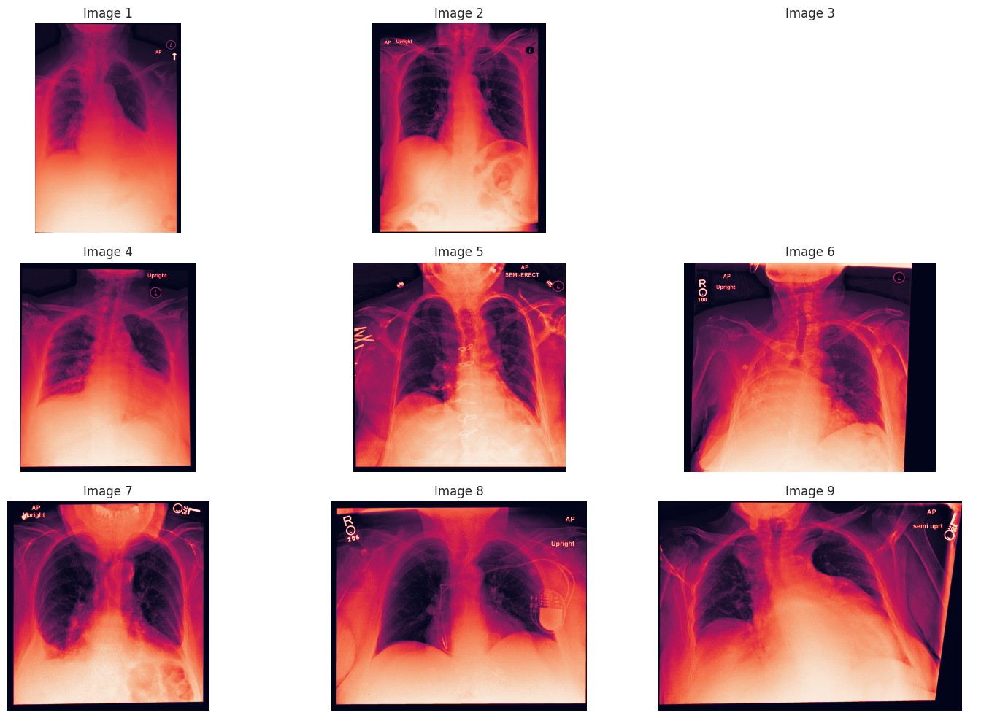

In [42]:
# Show examples of images with different characteristics
# Selected Images based on data grid
#LTop_path= 'train_images', '1348a3d8-405e32a8-1b6755b7-6688fe34-e9cd5c8e.jpg') #3056x2128 
#CTop_path= 'train_images', 'f1120017-812d2111-73ffb33d-8a0a2a1f-110bdf8d.jpg') #3056x2544
#LMid_path= 'sample_train_images', '6c802b6b-a5f10108-d9afee21-a00eb27a-57b0b056.jpg') #2535x2117
#CMid_path= 'train_images', '0fd0063a-9ac61f46-56c0ae0e-bddf9f3d-400c6623.jpg') #2513x2544
#RMid_path= 'train_images', 'f7d314bb-2e4de484-a4b8c0d9-1b8e5f18-332c046c.jpg') #2544x3056
#LBot_path= 'train_images', '382dd7b7-a82d68c6-9bced909-9b86f4e5-3c49cb90.jpg') #2208x2127
#CBot_path= 'train_images', '1e9d7e42-9fb08fcd-3ec2c973-75fb7ed3-f35ca299.jpg') #2089x2544
#RBot_path= 'train_images', 'e2f37dca-2aa7b7e6-e48809b2-316504fc-7f0904f2.jpg') #2112x3056 

print(images_local_base_dir)
# Image file paths in a list
image_paths = [
    'train_images/1348a3d8-405e32a8-1b6755b7-6688fe34-e9cd5c8e.jpg',  # LTop
    'train_images/f1120017-812d2111-73ffb33d-8a0a2a1f-110bdf8d.jpg',  # CTop
    None,  # Intentionally blank
    'sample_train_images/6c802b6b-a5f10108-d9afee21-a00eb27a-57b0b056.jpg',  # LMid
    'train_images/0fd0063a-9ac61f46-56c0ae0e-bddf9f3d-400c6623.jpg',  # CMid
    'train_images/f7d314bb-2e4de484-a4b8c0d9-1b8e5f18-332c046c.jpg',  # RMid
    'train_images/382dd7b7-a82d68c6-9bced909-9b86f4e5-3c49cb90.jpg',  # LBot
    'train_images/1e9d7e42-9fb08fcd-3ec2c973-75fb7ed3-f35ca299.jpg',  # CBot
    'train_images/e2f37dca-2aa7b7e6-e48809b2-316504fc-7f0904f2.jpg'   # RBot
]

# Create figure and axes
fig, axs = plt.subplots(3, 3, figsize=(15, 10))

# Flatten the axes array for easy indexing
axs = axs.flatten()

# Loop through image paths and axes to display images
for i, (ax, img_path) in enumerate(zip(axs, image_paths)):
    if img_path is not None:
        full_path = os.path.join(images_local_base_dir, img_path)
        img = mpimg.imread(full_path)
        ax.imshow(img)
    else:
        ax.axis('off')  # Hide axis for the blank spot
    ax.axis('off')  # Hide axes ticks for all
    ax.set_title(f'Image {i+1}')

# Adjust layout and display
plt.tight_layout()
plt.show()

### 7.3.2 Image Size Comparisons Using Aspect Ratio 
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

Replot trying to reflect aspect ratio

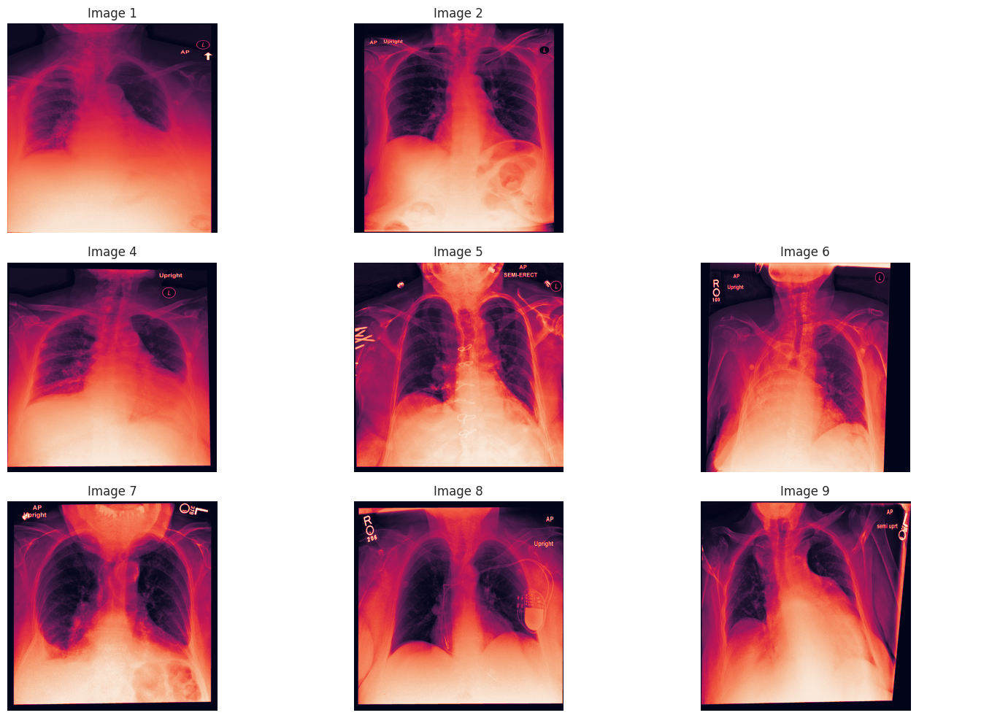

In [43]:
# Create figure and axes
fig, axs = plt.subplots(3, 3, figsize=(15, 10))

# Flatten the axes array for easy indexing
axs = axs.flatten()

# Loop through image paths and axes to display images
for i, (ax, img_path) in enumerate(zip(axs, image_paths)):
    if img_path is not None:  # Check if the image path is not None
        full_img_path = os.path.join(images_local_base_dir, img_path)
        img = mpimg.imread(full_img_path)
        aspect_ratio = img.shape[1] / img.shape[0]
        ax.imshow(img, aspect=aspect_ratio)  # Set aspect ratio for each image
    ax.axis('off')  # Hide axes ticks for all
    ax.set_title(f'Image {i+1}' if img_path is not None else '')  # Set title if image path is not None

plt.tight_layout()
plt.show()

### 7.3.3 Image Size Comparisons Using Image Dimension 
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

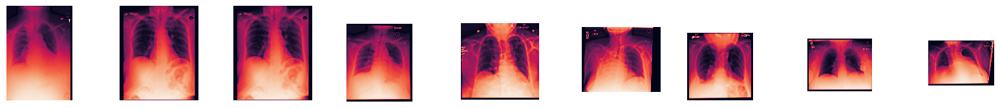

In [44]:
# Image file paths
image_paths2 = [
    'train_images/1348a3d8-405e32a8-1b6755b7-6688fe34-e9cd5c8e.jpg',  # LTop
    'train_images/f1120017-812d2111-73ffb33d-8a0a2a1f-110bdf8d.jpg',  # CTop
    'train_images/f1120017-812d2111-73ffb33d-8a0a2a1f-110bdf8d.jpg',  # CTop    # repeated here to avoid None issues
    'sample_train_images/6c802b6b-a5f10108-d9afee21-a00eb27a-57b0b056.jpg',  # LMid
    'train_images/0fd0063a-9ac61f46-56c0ae0e-bddf9f3d-400c6623.jpg',  # CMid
    'train_images/f7d314bb-2e4de484-a4b8c0d9-1b8e5f18-332c046c.jpg',  # RMid
    'train_images/382dd7b7-a82d68c6-9bced909-9b86f4e5-3c49cb90.jpg',  # LBot
    'train_images/1e9d7e42-9fb08fcd-3ec2c973-75fb7ed3-f35ca299.jpg',  # CBot
    'train_images/e2f37dca-2aa7b7e6-e48809b2-316504fc-7f0904f2.jpg'   # RBot
]

# Load images and calculate scaling factors
images = []
scaling_factors = []
max_width = 0
max_height = 0
for path in image_paths2:
    full_path = os.path.join(images_local_base_dir, path)
    img = mpimg.imread(full_path)
    images.append(img)
    height, width = img.shape[:2]
    scaling_factors.append((width, height))
    max_width = max(max_width, width)
    max_height = max(max_height, height)

# Calculate relative sizes for subplots
relative_widths = [width / max_width for width, height in scaling_factors]
relative_heights = [height / max_height for width, height in scaling_factors]

# Create a figure with subplots
fig, axs = plt.subplots(1, len(images), figsize=(20, 10))

# Plot each image in its subplot with relative size
for ax, img, rel_width, rel_height in zip(axs, images, relative_widths, relative_heights):
    ax.imshow(img)
    ax.axis('off')
    # Adjust subplot size
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * rel_width, box.height * rel_height])

plt.show()

Replot with titles

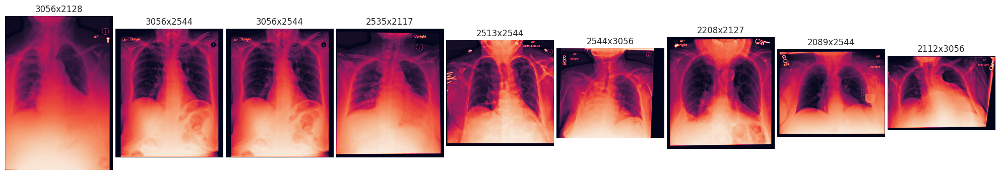

In [45]:
# Image file paths
image_paths2 = [
    'train_images/1348a3d8-405e32a8-1b6755b7-6688fe34-e9cd5c8e.jpg',  # LTop
    'train_images/f1120017-812d2111-73ffb33d-8a0a2a1f-110bdf8d.jpg',  # CTop
    'train_images/f1120017-812d2111-73ffb33d-8a0a2a1f-110bdf8d.jpg',  # CTop    # repeated here to avoid None issues
    'sample_train_images/6c802b6b-a5f10108-d9afee21-a00eb27a-57b0b056.jpg',  # LMid
    'train_images/0fd0063a-9ac61f46-56c0ae0e-bddf9f3d-400c6623.jpg',  # CMid
    'train_images/f7d314bb-2e4de484-a4b8c0d9-1b8e5f18-332c046c.jpg',  # RMid
    'train_images/382dd7b7-a82d68c6-9bced909-9b86f4e5-3c49cb90.jpg',  # LBot
    'train_images/1e9d7e42-9fb08fcd-3ec2c973-75fb7ed3-f35ca299.jpg',  # CBot
    'train_images/e2f37dca-2aa7b7e6-e48809b2-316504fc-7f0904f2.jpg'   # RBot
]

# Load images and calculate scaling factors
images = []
scaling_factors = []
max_width = 0
max_height = 0
for path in image_paths2:
    full_path = os.path.join(images_local_base_dir, path)
    img = mpimg.imread(full_path)
    images.append(img)
    height, width = img.shape[:2]
    scaling_factors.append((width, height))
    max_width = max(max_width, width)
    max_height = max(max_height, height)

# Calculate relative sizes for subplots
relative_widths = [width / max_width for width, height in scaling_factors]
relative_heights = [height / max_height for width, height in scaling_factors]

# Create a figure with subplots
fig, axs = plt.subplots(1, len(images), figsize=(20, 10))

# Check if axs is an instance of AxesSubplot, which happens when len(images) == 1
if isinstance(axs, plt.Axes):
    axs = [axs]

# Plot each image in its subplot with relative size and set the title
for ax, img, (width, height), rel_width, rel_height in zip(axs, images, scaling_factors, relative_widths, relative_heights):
    ax.imshow(img)
    ax.axis('off')
    # Set the title to display image dimensions
    ax.set_title(f'{height}x{width}')
    # Adjust subplot size
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * rel_width, box.height * rel_height])

plt.tight_layout()
plt.show()

Replot using 3 plots per row

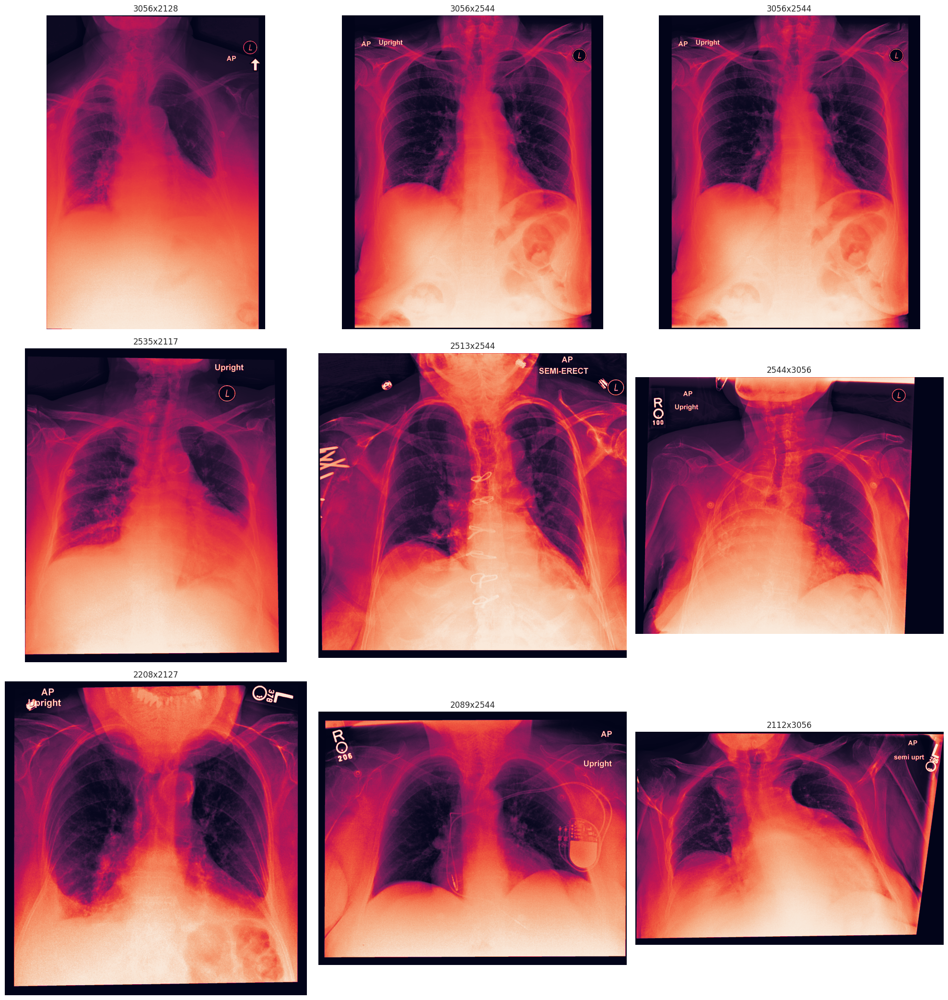

In [46]:
# Load images and calculate scaling factors
images = []
scaling_factors = []
max_width = 0
max_height = 0
for path in image_paths2:
    full_path = os.path.join(images_local_base_dir, path)
    img = mpimg.imread(full_path)
    images.append(img)
    height, width = img.shape[:2]
    scaling_factors.append((width, height))
    max_width = max(max_width, width)
    max_height = max(max_height, height)

# Calculate relative sizes for subplots
relative_widths = [width / max_width for width, height in scaling_factors]
relative_heights = [height / max_height for width, height in scaling_factors]

# Determine the number of rows needed
n_rows = int(np.ceil(len(images) / 3))

# Create a figure with subplots
fig, axs = plt.subplots(n_rows, 3, figsize=(20, n_rows * 7))

# If there's only one row, axs might not be a 2D array
if n_rows == 1:
    axs = np.array([axs])

# Flatten the axes array for easy indexing and hide unused subplots
axs = axs.flatten()
for ax in axs[len(images):]:
    ax.axis('off')

# Plot each image in its subplot with relative size and set the title
for ax, img, (width, height), rel_width, rel_height in zip(axs, images, scaling_factors, relative_widths, relative_heights):
    ax.imshow(img)
    ax.axis('off')
    # Set the title to display image dimensions
    ax.set_title(f'{height}x{width}')
    # Adjust subplot size, if necessary
    # box = ax.get_position()
    # ax.set_position([box.x0, box.y0, box.width * rel_width, box.height * rel_height])

plt.tight_layout()
plt.show()

### **Conclusions so far**:
This is frustrating...to display images in their original sizes while maintaining the aspect ratio and comparing them side by side. We need a different approach than matplotlib, as it inherently scales images to fit the designated plot area.

### 7.3.4 Image Size Comparisons Using Html 
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

Use html to display true sizes

In [47]:
html_content = '<html><head><title>Image Comparison</title></head><body><h1>Image Comparison</h1><table>'

for i, img_path in enumerate(image_paths2):
    if i % 3 == 0:
        html_content += '<tr>'
    if img_path is not None:
        # Construct the URL for the image
        img_url = f"http://localhost:8080/{img_path}"
        html_content += f'<td><img src="{img_url}" alt="Image {i+1}" style="width:auto;height:auto;"></td>'
    else:
        html_content += '<td></td>'
    if (i + 1) % 3 == 0 or i == len(image_paths2) - 1:
        html_content += '</tr>'

html_content += '</table></body></html>'

# Write the HTML content to a file
with open('image_comparison.html', 'w') as f:
    f.write(html_content)

The above produced icons only due to access problems from the container I setup. I perhaps need to reconfigure docker to allow 8000 serving. However, I want to avoid modifying and restartinr Docker containerlet's

Considinger a different approach by serving the static files (images, HTML, etc.) directly through Jupyter Notebook [Jupyter Notebook has the ability to serve static files from any directory it has access to]

..that did not work either.

### 7.3.5 Image Size Comparisons Using OpenCV
<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

Use CV2

In [48]:
def display_image(image_path):
    # Read the image
    img = cv2.imread(image_path)
    
    # Display the image in a window. The window adjusts to the image size.
    cv2.imshow('Image', img)
    
    # Wait for a key press to close the window
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [49]:
for path in image_paths2:
    full_path = os.path.join(images_local_base_dir, path)
    # Display the image
    display_image(full_path)

error: OpenCV(4.9.0) /io/opencv/modules/highgui/src/window.cpp:1272: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvShowImage'


Can't use it via Jupyter Notebook:(

#### Ignore how the images look on screen here and proceed with preprocessing methods anyway!

# 8 Final Processed Image Data 

<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

## 8.1 Remove Outliers 

<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [52]:
# Removal of Records based on Min & Max criteria 
Dropped_records= processed_df[(processed_df['Rows']>3056) | (processed_df['Columns']>3056) | (processed_df['Rows']<2050) | (processed_df['Columns']<2050)]

In [53]:
print(len(Dropped_records))
print(Dropped_records.info())
Dropped_records

30
<class 'pandas.core.frame.DataFrame'>
Index: 30 entries, 16246 to 7945
Data columns (total 23 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   patient_id                                  30 non-null     Int64  
 1   study_id                                    30 non-null     Int64  
 2   atelectasis                                 30 non-null     float64
 3   cardiomegaly                                30 non-null     float64
 4   edema                                       30 non-null     float64
 5   lung_opacity                                30 non-null     float64
 6   pleural_effusion                            30 non-null     float64
 7   pneumonia                                   30 non-null     float64
 8   data_type                                   30 non-null     object 
 9   is_sample                                   30 non-null     bool   
 10  dicom_id    

,patient_id,study_id,atelectasis,cardiomegaly,edema,lung_opacity,pleural_effusion,pneumonia,data_type,is_sample,dicom_id,PerformedProcedureStepDescription,ViewPosition,Rows,Columns,StudyDate,StudyTime,ProcedureCodeSequence_CodeMeaning,ViewCodeSequence_CodeMeaning,PatientOrientationCodeSequence_CodeMeaning,jpg_filename,anomaly,all_zeros
16246,19607507,59408757,0.0,0.0,0.0,0.0,0.0,0.0,test,False,879f8c51-0b13ee66-de5fe83f-a06270c5-2ae97ff8,NaN,PA,2022,2022,21481116,144156.000,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19607507/s59408757/879f8c51-0b13ee66-de5fe83f-a06270c5-2ae97ff8.jpg,-1,True
3815,12268505,59274048,0.0,0.0,0.0,0.0,0.0,0.0,test,False,34b622fd-863d05cb-f82cf4bd-ea921191-6290549a,NaN,PA,2022,2022,21850625,153522.000,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p12/p12268505/s59274048/34b622fd-863d05cb-f82cf4bd-ea921191-6290549a.jpg,-1,True
12541,17463311,52515537,0.0,0.0,0.0,0.0,0.0,0.0,test,False,a27b5f36-f206fffa-cb7eb662-475b6f9f-ac376a14,NaN,PA,2022,2022,21531021,154245.000,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p17/p17463311/s52515537/a27b5f36-f206fffa-cb7eb662-475b6f9f-ac376a14.jpg,-1,True
10497,16235760,52102220,0.0,0.0,0.0,0.0,0.0,0.0,train,True,f476316f-ba11c629-fb0de508-c5d90820-22e1240b,Performed Desc,PA,2022,2022,21460310,174059.000,CHEST (PA AND LAT),postero-anterior,Recumbent,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p16/p16235760/s52102220/f476316f-ba11c629-fb0de508-c5d90820-22e1240b.jpg,-1,True
9124,15429143,59335875,1.0,0.0,0.0,0.0,0.0,0.0,train,False,1ca0ec9c-029cd5da-e6b422f6-4e5895c5-779e7cb1,Performed Desc,PA,2022,1787,21201202,175416.000,CHEST (PA AND LAT),postero-anterior,Recumbent,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p15/p15429143/s59335875/1ca0ec9c-029cd5da-e6b422f6-4e5895c5-779e7cb1.jpg,-1,False
8579,15118488,50697004,0.0,0.0,0.0,0.0,0.0,0.0,train,False,8e777ead-fe16bc50-fa771ee4-240707e6-600dd1c8,NaN,PA,1926,1636,21520921,161915.000,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p15/p15118488/s50697004/8e777ead-fe16bc50-fa771ee4-240707e6-600dd1c8.jpg,-1,True
1123,10673550,58685105,0.0,0.0,0.0,0.0,0.0,0.0,train,True,6f9df5de-615e2df5-c08a2529-8d0da59c-578d0530,CHEST (PA AND LAT),NaN,2140,1760,21291009,174604.000,CHEST (PA AND LAT),NaN,NaN,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10673550/s58685105/6f9df5de-615e2df5-c08a2529-8d0da59c-578d0530.jpg,1,True
8502,15066909,50450021,1.0,0.0,0.0,1.0,0.0,0.0,train,False,0307012b-ca64a8e9-2efe86eb-85920851-bf3595fb,Performed Desc,PA,2021,1778,21650902,182208.000,CHEST (PA AND LAT),postero-anterior,Recumbent,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p15/p15066909/s50450021/0307012b-ca64a8e9-2efe86eb-85920851-bf3595fb.jpg,-1,False
8806,15247811,56614190,0.0,0.0,0.0,0.0,0.0,0.0,train,False,75d463a0-b1c0f3e6-14967802-36d68833-b3618fab,Performed Desc,PA,1809,2021,21580922,171044.000,CHEST (PA AND LAT),postero-anterior,Recumbent,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p15/p15247811/s56614190/75d463a0-b1c0f3e6-14967802-36d68833-b3618fab.jpg,-1,True
13498,18026405,56305761,0.0,1.0,0.0,0.0,0.0,0.0,train,False,a0f6348d-8e1d62ea-dab5e9bf-33e90bc3-a7db541d,CHEST (PA AND LAT),NaN,2140,1760,21660113,171935.000,CHEST (PA AND LAT),NaN,NaN,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p18/p18026405/s56305761/a0f6348d-8e1d62ea-dab5e9bf-33e90bc3-a7db541d.jpg,1,False


In [54]:
processed_df2 = processed_df[~processed_df['patient_id'].isin(Dropped_records['patient_id'])]
print(len(processed_df2))
print(processed_df2.info())
processed_df2.head(2)

16877
<class 'pandas.core.frame.DataFrame'>
Index: 16877 entries, 16906 to 8453
Data columns (total 23 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   patient_id                                  16877 non-null  Int64  
 1   study_id                                    16877 non-null  Int64  
 2   atelectasis                                 16877 non-null  float64
 3   cardiomegaly                                16877 non-null  float64
 4   edema                                       16877 non-null  float64
 5   lung_opacity                                16877 non-null  float64
 6   pleural_effusion                            16877 non-null  float64
 7   pneumonia                                   16877 non-null  float64
 8   data_type                                   16877 non-null  object 
 9   is_sample                                   16877 non-null  bool   
 10  dicom_

,patient_id,study_id,atelectasis,cardiomegaly,edema,lung_opacity,pleural_effusion,pneumonia,data_type,is_sample,dicom_id,PerformedProcedureStepDescription,ViewPosition,Rows,Columns,StudyDate,StudyTime,ProcedureCodeSequence_CodeMeaning,ViewCodeSequence_CodeMeaning,PatientOrientationCodeSequence_CodeMeaning,jpg_filename,anomaly,all_zeros
16906,19998562,52252154,0.0,0.0,0.0,0.0,1.0,0.0,test,False,e3e5f8c3-14429887-b1181522-445ec3a8-110663c3,CHEST (PA AND LAT),PA,3056,2544,21660321,224219.015,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19998562/s52252154/e3e5f8c3-14429887-b1181522-445ec3a8-110663c3.jpg,1,False
6427,13831580,55371824,0.0,0.0,0.0,0.0,0.0,0.0,test,False,f34f44ce-0feade9a-8a71da5b-6e080e42-643cb41d,CHEST (PA AND LAT),PA,3056,2544,22031114,210815.687,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13831580/s55371824/f34f44ce-0feade9a-8a71da5b-6e080e42-643cb41d.jpg,1,True


## 8.2 Create Sets Columns 

<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [55]:
# Add columns for sets 1, 2, and 3
max_rows    = processed_df2['Rows'].max()
max_columns = processed_df2['Columns'].max()
min_columns = processed_df2['Columns'].min()
mid_limit   = 2550

# Function to determine the set
def categorize(row):
    if row['Rows'] >= 2500 and row['Columns'] <= mid_limit:
        return 1
    elif row['Rows'] <= mid_limit and row['Columns'] >= 2500:
        return 2
    else:
        return 3

# Apply the function to each row
processed_df2['set'] = processed_df2.apply(categorize, axis=1)

/tmp/ipykernel_3234/2983135462.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  processed_df2['set'] = processed_df2.apply(categorize, axis=1)


## 8.3 Save Final Processed Image Data 

<div style="float:left; font-size:0.7em;"><a href="#returnToTop">Return to Top</a></div> <a id='setup'></a>

In [60]:
# Save processed_df2 to CSV
processed_df2.to_csv('Processed_Image_Data_Feb_28_2024.csv', index=False)  # 'index=False' to avoid writing row indices

In [56]:
print(processed_df2.info())
processed_df2.head(2)

<class 'pandas.core.frame.DataFrame'>
Index: 16877 entries, 16906 to 8453
Data columns (total 24 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   patient_id                                  16877 non-null  Int64  
 1   study_id                                    16877 non-null  Int64  
 2   atelectasis                                 16877 non-null  float64
 3   cardiomegaly                                16877 non-null  float64
 4   edema                                       16877 non-null  float64
 5   lung_opacity                                16877 non-null  float64
 6   pleural_effusion                            16877 non-null  float64
 7   pneumonia                                   16877 non-null  float64
 8   data_type                                   16877 non-null  object 
 9   is_sample                                   16877 non-null  bool   
 10  dicom_id    

,patient_id,study_id,atelectasis,cardiomegaly,edema,lung_opacity,pleural_effusion,pneumonia,data_type,is_sample,dicom_id,PerformedProcedureStepDescription,ViewPosition,Rows,Columns,StudyDate,StudyTime,ProcedureCodeSequence_CodeMeaning,ViewCodeSequence_CodeMeaning,PatientOrientationCodeSequence_CodeMeaning,jpg_filename,anomaly,all_zeros,set
16906,19998562,52252154,0.0,0.0,0.0,0.0,1.0,0.0,test,False,e3e5f8c3-14429887-b1181522-445ec3a8-110663c3,CHEST (PA AND LAT),PA,3056,2544,21660321,224219.015,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p19/p19998562/s52252154/e3e5f8c3-14429887-b1181522-445ec3a8-110663c3.jpg,1,False,1
6427,13831580,55371824,0.0,0.0,0.0,0.0,0.0,0.0,test,False,f34f44ce-0feade9a-8a71da5b-6e080e42-643cb41d,CHEST (PA AND LAT),PA,3056,2544,22031114,210815.687,CHEST (PA AND LAT),postero-anterior,Erect,https://physionet.org/files/mimic-cxr-jpg/2.0.0/files/p13/p13831580/s55371824/f34f44ce-0feade9a-8a71da5b-6e080e42-643cb41d.jpg,1,True,1


In [ ]:
# Also save Dropped_records for convenience of other teams
Dropped_records.to_csv('Dropped_Image_Records_Feb_28_2024.csv', index=False)  # 'index=False' to avoid writing row indices